In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Training with data augmentation

In [5]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [6]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(W/16*H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )
        
        self._weights_init()
        
    def _weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.xavier_normal(m.weight.data)

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [7]:
from cpe775.dataset import CroppedFaceLandmarksDataset, FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, RandomHorizontalFlip, ToPILImage, CenterCrop, RandomCrop

In [8]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [9]:
train_transforms = Compose([
                   ToPILImage(),
                   RandomCrop((224,224)),
                   RandomHorizontalFlip(),
                   ToGray(),
                   ToTensor()
                 ])

transforms = Compose([
                   ToPILImage(),
                   CenterCrop((224,224)),
                   ToGray(),
                   ToTensor()
                 ])

In [10]:
# load the dataset
train_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=train_transforms)
valid_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [11]:
net = CNNNet((1, 224, 224), (68, 2)) # input shape, output shape

In [12]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [13]:
np.sum([v.numel() for v in net.parameters()])

13268104

## Creating the loss function

In [14]:
import torch
from cpe775.criterion import NRMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [15]:
criterion = NRMSELoss()
criterion = criterion.cuda()

In [16]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [17]:
from torch.optim.lr_scheduler import MultiStepLR
from cpe775 import metrics

In [18]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint-lr-scheduler.pth.tar', 'val_loss', mode='min'),
        callbacks.LearningRateScheduler(MultiStepLR(optimizer, milestones=[750,900], gamma=0.1))
    ]

In [19]:
torch.mean

<function torch._C.mean>

In [20]:
model.fit_loader(train_loader, 1000, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list), metrics={'rmse': NRMSELoss(weight=68)})

Epoch: [0][0/79]	Time 0.943 (0.943)	Data 0.105 (0.105)	Train Loss 2.672 (2.672)	Train Rmse 181.728 (181.728)	
Epoch: [0][40/79]	Time 0.056 (0.078)	Data 0.001 (0.003)	Train Loss 0.335 (0.951)	Train Rmse 22.775 (64.637)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.123 (0.123)	Val Loss 0.261 (0.261)	Val Rmse 17.715 (17.715)	
Epoch: [1][0/79]	Time 0.149 (0.149)	Data 0.122 (0.122)	Train Loss 0.288 (0.288)	Train Rmse 19.588 (19.588)	
Epoch: [1][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.361 (0.349)	Train Rmse 24.569 (23.734)	
Val: [0/20]	Time 0.142 (0.142)	Data 0.120 (0.120)	Val Loss 0.271 (0.271)	Val Rmse 18.414 (18.414)	
Epoch: [2][0/79]	Time 0.138 (0.138)	Data 0.114 (0.114)	Train Loss 0.371 (0.371)	Train Rmse 25.215 (25.215)	
Epoch: [2][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.299 (0.310)	Train Rmse 20.355 (21.097)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.123 (0.123)	Val Loss 0.226 (0.226)	Val Rmse 15.396 (15.396)	
Epoch: [3][0/79]	Time 0.137 (0.137)	Data 0.111 (0.

Epoch: [26][40/79]	Time 0.090 (0.084)	Data 0.001 (0.005)	Train Loss 0.120 (0.126)	Train Rmse 8.143 (8.571)	
Val: [0/20]	Time 0.209 (0.209)	Data 0.187 (0.187)	Val Loss 0.113 (0.113)	Val Rmse 7.691 (7.691)	
Epoch: [27][0/79]	Time 0.173 (0.173)	Data 0.132 (0.132)	Train Loss 0.118 (0.118)	Train Rmse 8.017 (8.017)	
Epoch: [27][40/79]	Time 0.103 (0.083)	Data 0.001 (0.005)	Train Loss 0.124 (0.129)	Train Rmse 8.460 (8.782)	
Val: [0/20]	Time 0.237 (0.237)	Data 0.193 (0.193)	Val Loss 0.115 (0.115)	Val Rmse 7.817 (7.817)	
Epoch: [28][0/79]	Time 0.182 (0.182)	Data 0.157 (0.157)	Train Loss 0.118 (0.118)	Train Rmse 8.013 (8.013)	
Epoch: [28][40/79]	Time 0.083 (0.085)	Data 0.001 (0.006)	Train Loss 0.122 (0.126)	Train Rmse 8.300 (8.565)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.137 (0.137)	Val Loss 0.100 (0.100)	Val Rmse 6.787 (6.787)	
Epoch: [29][0/79]	Time 0.169 (0.169)	Data 0.141 (0.141)	Train Loss 0.122 (0.122)	Train Rmse 8.271 (8.271)	
Epoch: [29][40/79]	Time 0.082 (0.081)	Data 0.001 (0.005)	Train L

Val: [0/20]	Time 0.197 (0.197)	Data 0.155 (0.155)	Val Loss 0.106 (0.106)	Val Rmse 7.219 (7.219)	
Epoch: [53][0/79]	Time 0.161 (0.161)	Data 0.135 (0.135)	Train Loss 0.095 (0.095)	Train Rmse 6.475 (6.475)	
Epoch: [53][40/79]	Time 0.098 (0.084)	Data 0.001 (0.005)	Train Loss 0.099 (0.096)	Train Rmse 6.751 (6.523)	
Val: [0/20]	Time 0.187 (0.187)	Data 0.146 (0.146)	Val Loss 0.092 (0.092)	Val Rmse 6.278 (6.278)	
Epoch: [54][0/79]	Time 0.187 (0.187)	Data 0.141 (0.141)	Train Loss 0.095 (0.095)	Train Rmse 6.484 (6.484)	
Epoch: [54][40/79]	Time 0.096 (0.085)	Data 0.001 (0.005)	Train Loss 0.089 (0.096)	Train Rmse 6.044 (6.508)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.129 (0.129)	Val Loss 0.082 (0.082)	Val Rmse 5.578 (5.578)	
Epoch: [55][0/79]	Time 0.160 (0.160)	Data 0.124 (0.124)	Train Loss 0.094 (0.094)	Train Rmse 6.370 (6.370)	
Epoch: [55][40/79]	Time 0.066 (0.085)	Data 0.001 (0.004)	Train Loss 0.109 (0.094)	Train Rmse 7.401 (6.370)	
Val: [0/20]	Time 0.183 (0.183)	Data 0.161 (0.161)	Val Loss 0.084

Epoch: [79][0/79]	Time 0.158 (0.158)	Data 0.130 (0.130)	Train Loss 0.089 (0.089)	Train Rmse 6.041 (6.041)	
Epoch: [79][40/79]	Time 0.058 (0.090)	Data 0.001 (0.006)	Train Loss 0.092 (0.084)	Train Rmse 6.270 (5.691)	
Val: [0/20]	Time 0.171 (0.171)	Data 0.139 (0.139)	Val Loss 0.084 (0.084)	Val Rmse 5.721 (5.721)	
Epoch: [80][0/79]	Time 0.194 (0.194)	Data 0.155 (0.155)	Train Loss 0.085 (0.085)	Train Rmse 5.792 (5.792)	
Epoch: [80][40/79]	Time 0.059 (0.086)	Data 0.001 (0.007)	Train Loss 0.081 (0.084)	Train Rmse 5.532 (5.702)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.139 (0.139)	Val Loss 0.075 (0.075)	Val Rmse 5.112 (5.112)	
Epoch: [81][0/79]	Time 0.172 (0.172)	Data 0.133 (0.133)	Train Loss 0.090 (0.090)	Train Rmse 6.130 (6.130)	
Epoch: [81][40/79]	Time 0.110 (0.085)	Data 0.001 (0.006)	Train Loss 0.076 (0.083)	Train Rmse 5.198 (5.632)	
Val: [0/20]	Time 0.267 (0.267)	Data 0.230 (0.230)	Val Loss 0.079 (0.079)	Val Rmse 5.359 (5.359)	
Epoch: [82][0/79]	Time 0.180 (0.180)	Data 0.135 (0.135)	Train Lo

Epoch: [105][40/79]	Time 0.083 (0.083)	Data 0.004 (0.009)	Train Loss 0.069 (0.076)	Train Rmse 4.704 (5.169)	
Val: [0/20]	Time 0.322 (0.322)	Data 0.252 (0.252)	Val Loss 0.076 (0.076)	Val Rmse 5.135 (5.135)	
Epoch: [106][0/79]	Time 0.220 (0.220)	Data 0.194 (0.194)	Train Loss 0.080 (0.080)	Train Rmse 5.473 (5.473)	
Epoch: [106][40/79]	Time 0.101 (0.092)	Data 0.001 (0.007)	Train Loss 0.073 (0.076)	Train Rmse 4.932 (5.192)	
Val: [0/20]	Time 0.223 (0.223)	Data 0.185 (0.185)	Val Loss 0.076 (0.076)	Val Rmse 5.190 (5.190)	
Epoch: [107][0/79]	Time 0.234 (0.234)	Data 0.170 (0.170)	Train Loss 0.078 (0.078)	Train Rmse 5.320 (5.320)	
Epoch: [107][40/79]	Time 0.090 (0.085)	Data 0.002 (0.009)	Train Loss 0.075 (0.075)	Train Rmse 5.112 (5.105)	
Val: [0/20]	Time 0.206 (0.206)	Data 0.163 (0.163)	Val Loss 0.071 (0.071)	Val Rmse 4.827 (4.827)	
Epoch: [108][0/79]	Time 0.195 (0.195)	Data 0.168 (0.168)	Train Loss 0.071 (0.071)	Train Rmse 4.859 (4.859)	
Epoch: [108][40/79]	Time 0.091 (0.088)	Data 0.001 (0.007)	

Val: [0/20]	Time 0.241 (0.241)	Data 0.214 (0.214)	Val Loss 0.079 (0.079)	Val Rmse 5.371 (5.371)	
Epoch: [132][0/79]	Time 0.275 (0.275)	Data 0.236 (0.236)	Train Loss 0.071 (0.071)	Train Rmse 4.848 (4.848)	
Epoch: [132][40/79]	Time 0.097 (0.085)	Data 0.001 (0.011)	Train Loss 0.081 (0.069)	Train Rmse 5.479 (4.678)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.146 (0.146)	Val Loss 0.079 (0.079)	Val Rmse 5.345 (5.345)	
Epoch: [133][0/79]	Time 0.204 (0.204)	Data 0.159 (0.159)	Train Loss 0.065 (0.065)	Train Rmse 4.409 (4.409)	
Epoch: [133][40/79]	Time 0.057 (0.083)	Data 0.001 (0.008)	Train Loss 0.072 (0.069)	Train Rmse 4.907 (4.691)	
Val: [0/20]	Time 0.178 (0.178)	Data 0.155 (0.155)	Val Loss 0.071 (0.071)	Val Rmse 4.801 (4.801)	
Epoch: [134][0/79]	Time 0.217 (0.217)	Data 0.167 (0.167)	Train Loss 0.085 (0.085)	Train Rmse 5.794 (5.794)	
Epoch: [134][40/79]	Time 0.090 (0.083)	Data 0.001 (0.008)	Train Loss 0.071 (0.070)	Train Rmse 4.819 (4.768)	
Val: [0/20]	Time 0.228 (0.228)	Data 0.187 (0.187)	Val Loss

Epoch: [158][0/79]	Time 0.199 (0.199)	Data 0.172 (0.172)	Train Loss 0.067 (0.067)	Train Rmse 4.544 (4.544)	
Epoch: [158][40/79]	Time 0.069 (0.083)	Data 0.001 (0.006)	Train Loss 0.058 (0.065)	Train Rmse 3.958 (4.433)	
Val: [0/20]	Time 0.238 (0.238)	Data 0.202 (0.202)	Val Loss 0.076 (0.076)	Val Rmse 5.181 (5.181)	
Epoch: [159][0/79]	Time 0.180 (0.180)	Data 0.152 (0.152)	Train Loss 0.067 (0.067)	Train Rmse 4.538 (4.538)	
Epoch: [159][40/79]	Time 0.107 (0.085)	Data 0.001 (0.009)	Train Loss 0.076 (0.066)	Train Rmse 5.201 (4.518)	
Val: [0/20]	Time 0.228 (0.228)	Data 0.195 (0.195)	Val Loss 0.070 (0.070)	Val Rmse 4.790 (4.790)	
Epoch: [160][0/79]	Time 0.159 (0.159)	Data 0.133 (0.133)	Train Loss 0.064 (0.064)	Train Rmse 4.338 (4.338)	
Epoch: [160][40/79]	Time 0.057 (0.081)	Data 0.001 (0.007)	Train Loss 0.074 (0.066)	Train Rmse 5.019 (4.466)	
Val: [0/20]	Time 0.280 (0.280)	Data 0.254 (0.254)	Val Loss 0.072 (0.072)	Val Rmse 4.927 (4.927)	
Epoch: [161][0/79]	Time 0.193 (0.193)	Data 0.151 (0.151)	T

Epoch: [184][40/79]	Time 0.097 (0.083)	Data 0.002 (0.007)	Train Loss 0.058 (0.061)	Train Rmse 3.931 (4.182)	
Val: [0/20]	Time 0.269 (0.269)	Data 0.229 (0.229)	Val Loss 0.068 (0.068)	Val Rmse 4.650 (4.650)	
Epoch: [185][0/79]	Time 0.200 (0.200)	Data 0.154 (0.154)	Train Loss 0.057 (0.057)	Train Rmse 3.903 (3.903)	
Epoch: [185][40/79]	Time 0.107 (0.082)	Data 0.001 (0.010)	Train Loss 0.065 (0.061)	Train Rmse 4.422 (4.180)	
Val: [0/20]	Time 0.199 (0.199)	Data 0.173 (0.173)	Val Loss 0.073 (0.073)	Val Rmse 4.964 (4.964)	
Epoch: [186][0/79]	Time 0.250 (0.250)	Data 0.221 (0.221)	Train Loss 0.066 (0.066)	Train Rmse 4.459 (4.459)	
Epoch: [186][40/79]	Time 0.095 (0.082)	Data 0.002 (0.010)	Train Loss 0.057 (0.062)	Train Rmse 3.878 (4.234)	
Val: [0/20]	Time 0.263 (0.263)	Data 0.229 (0.229)	Val Loss 0.072 (0.072)	Val Rmse 4.888 (4.888)	
Epoch: [187][0/79]	Time 0.227 (0.227)	Data 0.184 (0.184)	Train Loss 0.062 (0.062)	Train Rmse 4.221 (4.221)	
Epoch: [187][40/79]	Time 0.094 (0.084)	Data 0.006 (0.012)	

Val: [0/20]	Time 0.196 (0.196)	Data 0.173 (0.173)	Val Loss 0.074 (0.074)	Val Rmse 5.059 (5.059)	
Epoch: [211][0/79]	Time 0.186 (0.186)	Data 0.160 (0.160)	Train Loss 0.057 (0.057)	Train Rmse 3.874 (3.874)	
Epoch: [211][40/79]	Time 0.057 (0.082)	Data 0.001 (0.007)	Train Loss 0.060 (0.059)	Train Rmse 4.088 (4.037)	
Val: [0/20]	Time 0.192 (0.192)	Data 0.169 (0.169)	Val Loss 0.076 (0.076)	Val Rmse 5.160 (5.160)	
Epoch: [212][0/79]	Time 0.228 (0.228)	Data 0.174 (0.174)	Train Loss 0.064 (0.064)	Train Rmse 4.376 (4.376)	
Epoch: [212][40/79]	Time 0.084 (0.083)	Data 0.002 (0.007)	Train Loss 0.055 (0.059)	Train Rmse 3.728 (4.037)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.148 (0.148)	Val Loss 0.064 (0.064)	Val Rmse 4.319 (4.319)	
Epoch: [213][0/79]	Time 0.264 (0.264)	Data 0.224 (0.224)	Train Loss 0.056 (0.056)	Train Rmse 3.786 (3.786)	
Epoch: [213][40/79]	Time 0.071 (0.088)	Data 0.003 (0.008)	Train Loss 0.063 (0.060)	Train Rmse 4.311 (4.054)	
Val: [0/20]	Time 0.181 (0.181)	Data 0.157 (0.157)	Val Loss

Epoch: [237][0/79]	Time 0.227 (0.227)	Data 0.198 (0.198)	Train Loss 0.063 (0.063)	Train Rmse 4.297 (4.297)	
Epoch: [237][40/79]	Time 0.101 (0.086)	Data 0.001 (0.008)	Train Loss 0.049 (0.058)	Train Rmse 3.344 (3.958)	
Val: [0/20]	Time 0.214 (0.214)	Data 0.164 (0.164)	Val Loss 0.069 (0.069)	Val Rmse 4.696 (4.696)	
Epoch: [238][0/79]	Time 0.164 (0.164)	Data 0.136 (0.136)	Train Loss 0.057 (0.057)	Train Rmse 3.906 (3.906)	
Epoch: [238][40/79]	Time 0.057 (0.080)	Data 0.001 (0.007)	Train Loss 0.057 (0.057)	Train Rmse 3.858 (3.851)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.127 (0.127)	Val Loss 0.071 (0.071)	Val Rmse 4.838 (4.838)	
Epoch: [239][0/79]	Time 0.307 (0.307)	Data 0.266 (0.266)	Train Loss 0.055 (0.055)	Train Rmse 3.749 (3.749)	
Epoch: [239][40/79]	Time 0.067 (0.088)	Data 0.026 (0.012)	Train Loss 0.055 (0.056)	Train Rmse 3.762 (3.775)	
Val: [0/20]	Time 0.191 (0.191)	Data 0.168 (0.168)	Val Loss 0.069 (0.069)	Val Rmse 4.687 (4.687)	
Epoch: [240][0/79]	Time 0.272 (0.272)	Data 0.221 (0.221)	T

Epoch: [263][40/79]	Time 0.057 (0.087)	Data 0.001 (0.007)	Train Loss 0.055 (0.055)	Train Rmse 3.771 (3.728)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.133 (0.133)	Val Loss 0.078 (0.078)	Val Rmse 5.322 (5.322)	
Epoch: [264][0/79]	Time 0.207 (0.207)	Data 0.163 (0.163)	Train Loss 0.058 (0.058)	Train Rmse 3.920 (3.920)	
Epoch: [264][40/79]	Time 0.088 (0.087)	Data 0.002 (0.008)	Train Loss 0.054 (0.054)	Train Rmse 3.639 (3.699)	
Val: [0/20]	Time 0.182 (0.182)	Data 0.149 (0.149)	Val Loss 0.076 (0.076)	Val Rmse 5.150 (5.150)	
Epoch: [265][0/79]	Time 0.221 (0.221)	Data 0.184 (0.184)	Train Loss 0.062 (0.062)	Train Rmse 4.242 (4.242)	
Epoch: [265][40/79]	Time 0.058 (0.092)	Data 0.001 (0.008)	Train Loss 0.055 (0.054)	Train Rmse 3.765 (3.679)	
Val: [0/20]	Time 0.219 (0.219)	Data 0.195 (0.195)	Val Loss 0.076 (0.076)	Val Rmse 5.149 (5.149)	
Epoch: [266][0/79]	Time 0.161 (0.161)	Data 0.134 (0.134)	Train Loss 0.053 (0.053)	Train Rmse 3.589 (3.589)	
Epoch: [266][40/79]	Time 0.084 (0.087)	Data 0.001 (0.007)	

Val: [0/20]	Time 0.223 (0.223)	Data 0.187 (0.187)	Val Loss 0.071 (0.071)	Val Rmse 4.797 (4.797)	
Epoch: [290][0/79]	Time 0.244 (0.244)	Data 0.216 (0.216)	Train Loss 0.046 (0.046)	Train Rmse 3.108 (3.108)	
Epoch: [290][40/79]	Time 0.075 (0.085)	Data 0.010 (0.009)	Train Loss 0.048 (0.053)	Train Rmse 3.268 (3.599)	
Val: [0/20]	Time 0.230 (0.230)	Data 0.207 (0.207)	Val Loss 0.073 (0.073)	Val Rmse 4.933 (4.933)	
Epoch: [291][0/79]	Time 0.209 (0.209)	Data 0.176 (0.176)	Train Loss 0.050 (0.050)	Train Rmse 3.423 (3.423)	
Epoch: [291][40/79]	Time 0.058 (0.090)	Data 0.002 (0.006)	Train Loss 0.051 (0.052)	Train Rmse 3.451 (3.533)	
Val: [0/20]	Time 0.180 (0.180)	Data 0.145 (0.145)	Val Loss 0.076 (0.076)	Val Rmse 5.196 (5.196)	
Epoch: [292][0/79]	Time 0.163 (0.163)	Data 0.137 (0.137)	Train Loss 0.056 (0.056)	Train Rmse 3.781 (3.781)	
Epoch: [292][40/79]	Time 0.067 (0.087)	Data 0.001 (0.007)	Train Loss 0.052 (0.052)	Train Rmse 3.513 (3.560)	
Val: [0/20]	Time 0.235 (0.235)	Data 0.196 (0.196)	Val Loss

Epoch: [316][0/79]	Time 0.215 (0.215)	Data 0.173 (0.173)	Train Loss 0.052 (0.052)	Train Rmse 3.557 (3.557)	
Epoch: [316][40/79]	Time 0.102 (0.089)	Data 0.001 (0.007)	Train Loss 0.046 (0.051)	Train Rmse 3.103 (3.491)	
Val: [0/20]	Time 0.215 (0.215)	Data 0.178 (0.178)	Val Loss 0.077 (0.077)	Val Rmse 5.210 (5.210)	
Epoch: [317][0/79]	Time 0.225 (0.225)	Data 0.190 (0.190)	Train Loss 0.049 (0.049)	Train Rmse 3.326 (3.326)	
Epoch: [317][40/79]	Time 0.058 (0.089)	Data 0.001 (0.007)	Train Loss 0.054 (0.051)	Train Rmse 3.667 (3.474)	
Val: [0/20]	Time 0.180 (0.180)	Data 0.158 (0.158)	Val Loss 0.065 (0.065)	Val Rmse 4.426 (4.426)	
Epoch: [318][0/79]	Time 0.227 (0.227)	Data 0.198 (0.198)	Train Loss 0.051 (0.051)	Train Rmse 3.457 (3.457)	
Epoch: [318][40/79]	Time 0.090 (0.087)	Data 0.002 (0.008)	Train Loss 0.050 (0.051)	Train Rmse 3.385 (3.469)	
Val: [0/20]	Time 0.183 (0.183)	Data 0.157 (0.157)	Val Loss 0.079 (0.079)	Val Rmse 5.405 (5.405)	
Epoch: [319][0/79]	Time 0.206 (0.206)	Data 0.168 (0.168)	T

Epoch: [342][40/79]	Time 0.110 (0.089)	Data 0.001 (0.007)	Train Loss 0.049 (0.050)	Train Rmse 3.357 (3.394)	
Val: [0/20]	Time 0.235 (0.235)	Data 0.192 (0.192)	Val Loss 0.063 (0.063)	Val Rmse 4.310 (4.310)	
Epoch: [343][0/79]	Time 0.231 (0.231)	Data 0.194 (0.194)	Train Loss 0.051 (0.051)	Train Rmse 3.434 (3.434)	
Epoch: [343][40/79]	Time 0.097 (0.087)	Data 0.001 (0.008)	Train Loss 0.048 (0.049)	Train Rmse 3.279 (3.366)	
Val: [0/20]	Time 0.214 (0.214)	Data 0.176 (0.176)	Val Loss 0.064 (0.064)	Val Rmse 4.359 (4.359)	
Epoch: [344][0/79]	Time 0.221 (0.221)	Data 0.184 (0.184)	Train Loss 0.052 (0.052)	Train Rmse 3.523 (3.523)	
Epoch: [344][40/79]	Time 0.097 (0.086)	Data 0.006 (0.008)	Train Loss 0.048 (0.049)	Train Rmse 3.280 (3.318)	
Val: [0/20]	Time 0.190 (0.190)	Data 0.161 (0.161)	Val Loss 0.069 (0.069)	Val Rmse 4.675 (4.675)	
Epoch: [345][0/79]	Time 0.200 (0.200)	Data 0.171 (0.171)	Train Loss 0.049 (0.049)	Train Rmse 3.306 (3.306)	
Epoch: [345][40/79]	Time 0.057 (0.087)	Data 0.001 (0.008)	

Val: [0/20]	Time 0.166 (0.166)	Data 0.142 (0.142)	Val Loss 0.064 (0.064)	Val Rmse 4.319 (4.319)	
Epoch: [369][0/79]	Time 0.170 (0.170)	Data 0.145 (0.145)	Train Loss 0.048 (0.048)	Train Rmse 3.250 (3.250)	
Epoch: [369][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.046 (0.049)	Train Rmse 3.103 (3.307)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.147 (0.147)	Val Loss 0.066 (0.066)	Val Rmse 4.497 (4.497)	
Epoch: [370][0/79]	Time 0.179 (0.179)	Data 0.153 (0.153)	Train Loss 0.045 (0.045)	Train Rmse 3.057 (3.057)	
Epoch: [370][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.049 (0.047)	Train Rmse 3.314 (3.224)	
Val: [0/20]	Time 0.173 (0.173)	Data 0.148 (0.148)	Val Loss 0.067 (0.067)	Val Rmse 4.542 (4.542)	
Epoch: [371][0/79]	Time 0.172 (0.172)	Data 0.144 (0.144)	Train Loss 0.045 (0.045)	Train Rmse 3.087 (3.087)	
Epoch: [371][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.044 (0.047)	Train Rmse 3.021 (3.191)	
Val: [0/20]	Time 0.188 (0.188)	Data 0.166 (0.166)	Val Loss

Epoch: [395][0/79]	Time 0.164 (0.164)	Data 0.139 (0.139)	Train Loss 0.054 (0.054)	Train Rmse 3.675 (3.675)	
Epoch: [395][40/79]	Time 0.059 (0.060)	Data 0.001 (0.005)	Train Loss 0.043 (0.047)	Train Rmse 2.921 (3.183)	
Val: [0/20]	Time 0.178 (0.178)	Data 0.156 (0.156)	Val Loss 0.068 (0.068)	Val Rmse 4.640 (4.640)	
Epoch: [396][0/79]	Time 0.205 (0.205)	Data 0.178 (0.178)	Train Loss 0.044 (0.044)	Train Rmse 2.987 (2.987)	
Epoch: [396][40/79]	Time 0.057 (0.061)	Data 0.002 (0.006)	Train Loss 0.047 (0.047)	Train Rmse 3.220 (3.200)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.132 (0.132)	Val Loss 0.067 (0.067)	Val Rmse 4.529 (4.529)	
Epoch: [397][0/79]	Time 0.162 (0.162)	Data 0.134 (0.134)	Train Loss 0.043 (0.043)	Train Rmse 2.927 (2.927)	
Epoch: [397][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.046 (0.046)	Train Rmse 3.144 (3.152)	
Val: [0/20]	Time 0.185 (0.185)	Data 0.162 (0.162)	Val Loss 0.082 (0.082)	Val Rmse 5.603 (5.603)	
Epoch: [398][0/79]	Time 0.163 (0.163)	Data 0.137 (0.137)	T

Epoch: [421][40/79]	Time 0.057 (0.059)	Data 0.001 (0.005)	Train Loss 0.040 (0.045)	Train Rmse 2.747 (3.062)	
Val: [0/20]	Time 0.180 (0.180)	Data 0.157 (0.157)	Val Loss 0.073 (0.073)	Val Rmse 4.986 (4.986)	
Epoch: [422][0/79]	Time 0.146 (0.146)	Data 0.119 (0.119)	Train Loss 0.045 (0.045)	Train Rmse 3.091 (3.091)	
Epoch: [422][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.045 (0.045)	Train Rmse 3.030 (3.092)	
Val: [0/20]	Time 0.182 (0.182)	Data 0.159 (0.159)	Val Loss 0.065 (0.065)	Val Rmse 4.397 (4.397)	
Epoch: [423][0/79]	Time 0.182 (0.182)	Data 0.155 (0.155)	Train Loss 0.048 (0.048)	Train Rmse 3.280 (3.280)	
Epoch: [423][40/79]	Time 0.056 (0.060)	Data 0.018 (0.005)	Train Loss 0.046 (0.045)	Train Rmse 3.101 (3.059)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.126 (0.126)	Val Loss 0.066 (0.066)	Val Rmse 4.475 (4.475)	
Epoch: [424][0/79]	Time 0.199 (0.199)	Data 0.173 (0.173)	Train Loss 0.044 (0.044)	Train Rmse 2.989 (2.989)	
Epoch: [424][40/79]	Time 0.058 (0.061)	Data 0.001 (0.006)	

Val: [0/20]	Time 0.213 (0.213)	Data 0.190 (0.190)	Val Loss 0.065 (0.065)	Val Rmse 4.444 (4.444)	
Epoch: [448][0/79]	Time 0.161 (0.161)	Data 0.134 (0.134)	Train Loss 0.044 (0.044)	Train Rmse 2.960 (2.960)	
Epoch: [448][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.042 (0.044)	Train Rmse 2.889 (2.979)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.139 (0.139)	Val Loss 0.083 (0.083)	Val Rmse 5.668 (5.668)	
Epoch: [449][0/79]	Time 0.185 (0.185)	Data 0.159 (0.159)	Train Loss 0.043 (0.043)	Train Rmse 2.946 (2.946)	
Epoch: [449][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.042 (0.044)	Train Rmse 2.866 (3.008)	
Val: [0/20]	Time 0.182 (0.182)	Data 0.160 (0.160)	Val Loss 0.070 (0.070)	Val Rmse 4.785 (4.785)	
Epoch: [450][0/79]	Time 0.157 (0.157)	Data 0.130 (0.130)	Train Loss 0.044 (0.044)	Train Rmse 3.018 (3.018)	
Epoch: [450][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.043 (0.044)	Train Rmse 2.896 (3.000)	
Val: [0/20]	Time 0.186 (0.186)	Data 0.164 (0.164)	Val Loss

Epoch: [474][0/79]	Time 0.172 (0.172)	Data 0.146 (0.146)	Train Loss 0.049 (0.049)	Train Rmse 3.322 (3.322)	
Epoch: [474][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.041 (0.043)	Train Rmse 2.804 (2.926)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.152 (0.152)	Val Loss 0.068 (0.068)	Val Rmse 4.654 (4.654)	
Epoch: [475][0/79]	Time 0.157 (0.157)	Data 0.132 (0.132)	Train Loss 0.041 (0.041)	Train Rmse 2.786 (2.786)	
Epoch: [475][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.045 (0.043)	Train Rmse 3.082 (2.902)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.149 (0.149)	Val Loss 0.070 (0.070)	Val Rmse 4.736 (4.736)	
Epoch: [476][0/79]	Time 0.156 (0.156)	Data 0.130 (0.130)	Train Loss 0.042 (0.042)	Train Rmse 2.844 (2.844)	
Epoch: [476][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.043 (0.042)	Train Rmse 2.931 (2.864)	
Val: [0/20]	Time 0.201 (0.201)	Data 0.178 (0.178)	Val Loss 0.066 (0.066)	Val Rmse 4.517 (4.517)	
Epoch: [477][0/79]	Time 0.185 (0.185)	Data 0.159 (0.159)	T

Epoch: [500][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.042 (0.042)	Train Rmse 2.878 (2.884)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.153 (0.153)	Val Loss 0.072 (0.072)	Val Rmse 4.903 (4.903)	
Epoch: [501][0/79]	Time 0.160 (0.160)	Data 0.135 (0.135)	Train Loss 0.044 (0.044)	Train Rmse 2.992 (2.992)	
Epoch: [501][40/79]	Time 0.057 (0.059)	Data 0.001 (0.005)	Train Loss 0.038 (0.042)	Train Rmse 2.612 (2.837)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.128 (0.128)	Val Loss 0.075 (0.075)	Val Rmse 5.075 (5.075)	
Epoch: [502][0/79]	Time 0.161 (0.161)	Data 0.133 (0.133)	Train Loss 0.041 (0.041)	Train Rmse 2.798 (2.798)	
Epoch: [502][40/79]	Time 0.056 (0.059)	Data 0.001 (0.005)	Train Loss 0.048 (0.042)	Train Rmse 3.253 (2.855)	
Val: [0/20]	Time 0.204 (0.204)	Data 0.181 (0.181)	Val Loss 0.064 (0.064)	Val Rmse 4.335 (4.335)	
Epoch: [503][0/79]	Time 0.173 (0.173)	Data 0.146 (0.146)	Train Loss 0.040 (0.040)	Train Rmse 2.730 (2.730)	
Epoch: [503][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	

Val: [0/20]	Time 0.170 (0.170)	Data 0.147 (0.147)	Val Loss 0.079 (0.079)	Val Rmse 5.345 (5.345)	
Epoch: [527][0/79]	Time 0.180 (0.180)	Data 0.153 (0.153)	Train Loss 0.043 (0.043)	Train Rmse 2.940 (2.940)	
Epoch: [527][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.041 (0.042)	Train Rmse 2.807 (2.844)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.131 (0.131)	Val Loss 0.071 (0.071)	Val Rmse 4.821 (4.821)	
Epoch: [528][0/79]	Time 0.174 (0.174)	Data 0.148 (0.148)	Train Loss 0.039 (0.039)	Train Rmse 2.670 (2.670)	
Epoch: [528][40/79]	Time 0.057 (0.060)	Data 0.001 (0.006)	Train Loss 0.043 (0.041)	Train Rmse 2.893 (2.801)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.129 (0.129)	Val Loss 0.074 (0.074)	Val Rmse 5.032 (5.032)	
Epoch: [529][0/79]	Time 0.170 (0.170)	Data 0.142 (0.142)	Train Loss 0.039 (0.039)	Train Rmse 2.620 (2.620)	
Epoch: [529][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.040 (0.041)	Train Rmse 2.716 (2.766)	
Val: [0/20]	Time 0.176 (0.176)	Data 0.154 (0.154)	Val Loss

Epoch: [553][0/79]	Time 0.168 (0.168)	Data 0.141 (0.141)	Train Loss 0.039 (0.039)	Train Rmse 2.653 (2.653)	
Epoch: [553][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.043 (0.041)	Train Rmse 2.944 (2.786)	
Val: [0/20]	Time 0.180 (0.180)	Data 0.157 (0.157)	Val Loss 0.069 (0.069)	Val Rmse 4.700 (4.700)	
Epoch: [554][0/79]	Time 0.156 (0.156)	Data 0.129 (0.129)	Train Loss 0.041 (0.041)	Train Rmse 2.783 (2.783)	
Epoch: [554][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.040 (0.041)	Train Rmse 2.691 (2.754)	
Val: [0/20]	Time 0.166 (0.166)	Data 0.143 (0.143)	Val Loss 0.069 (0.069)	Val Rmse 4.724 (4.724)	
Epoch: [555][0/79]	Time 0.154 (0.154)	Data 0.128 (0.128)	Train Loss 0.041 (0.041)	Train Rmse 2.819 (2.819)	
Epoch: [555][40/79]	Time 0.057 (0.059)	Data 0.001 (0.005)	Train Loss 0.040 (0.041)	Train Rmse 2.727 (2.767)	
Val: [0/20]	Time 0.168 (0.168)	Data 0.145 (0.145)	Val Loss 0.068 (0.068)	Val Rmse 4.622 (4.622)	
Epoch: [556][0/79]	Time 0.153 (0.153)	Data 0.126 (0.126)	T

Epoch: [579][40/79]	Time 0.058 (0.060)	Data 0.001 (0.006)	Train Loss 0.039 (0.040)	Train Rmse 2.644 (2.705)	
Val: [0/20]	Time 0.171 (0.171)	Data 0.149 (0.149)	Val Loss 0.076 (0.076)	Val Rmse 5.176 (5.176)	
Epoch: [580][0/79]	Time 0.174 (0.174)	Data 0.147 (0.147)	Train Loss 0.038 (0.038)	Train Rmse 2.573 (2.573)	
Epoch: [580][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.038 (0.039)	Train Rmse 2.579 (2.658)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.147 (0.147)	Val Loss 0.075 (0.075)	Val Rmse 5.110 (5.110)	
Epoch: [581][0/79]	Time 0.165 (0.165)	Data 0.131 (0.131)	Train Loss 0.041 (0.041)	Train Rmse 2.787 (2.787)	
Epoch: [581][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.039 (0.040)	Train Rmse 2.662 (2.712)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.152 (0.152)	Val Loss 0.069 (0.069)	Val Rmse 4.693 (4.693)	
Epoch: [582][0/79]	Time 0.172 (0.172)	Data 0.147 (0.147)	Train Loss 0.038 (0.038)	Train Rmse 2.613 (2.613)	
Epoch: [582][40/79]	Time 0.056 (0.060)	Data 0.001 (0.006)	

Val: [0/20]	Time 0.183 (0.183)	Data 0.161 (0.161)	Val Loss 0.061 (0.061)	Val Rmse 4.178 (4.178)	
Epoch: [606][0/79]	Time 0.141 (0.141)	Data 0.116 (0.116)	Train Loss 0.038 (0.038)	Train Rmse 2.607 (2.607)	
Epoch: [606][40/79]	Time 0.057 (0.059)	Data 0.001 (0.005)	Train Loss 0.040 (0.039)	Train Rmse 2.752 (2.631)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.140 (0.140)	Val Loss 0.071 (0.071)	Val Rmse 4.817 (4.817)	
Epoch: [607][0/79]	Time 0.174 (0.174)	Data 0.141 (0.141)	Train Loss 0.043 (0.043)	Train Rmse 2.956 (2.956)	
Epoch: [607][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.038 (0.038)	Train Rmse 2.558 (2.604)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.129 (0.129)	Val Loss 0.078 (0.078)	Val Rmse 5.307 (5.307)	
Epoch: [608][0/79]	Time 0.189 (0.189)	Data 0.162 (0.162)	Train Loss 0.039 (0.039)	Train Rmse 2.665 (2.665)	
Epoch: [608][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.036 (0.038)	Train Rmse 2.420 (2.607)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.127 (0.127)	Val Loss

Epoch: [632][0/79]	Time 0.171 (0.171)	Data 0.144 (0.144)	Train Loss 0.040 (0.040)	Train Rmse 2.743 (2.743)	
Epoch: [632][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.036 (0.038)	Train Rmse 2.453 (2.599)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.149 (0.149)	Val Loss 0.068 (0.068)	Val Rmse 4.612 (4.612)	
Epoch: [633][0/79]	Time 0.165 (0.165)	Data 0.139 (0.139)	Train Loss 0.038 (0.038)	Train Rmse 2.579 (2.579)	
Epoch: [633][40/79]	Time 0.056 (0.060)	Data 0.002 (0.006)	Train Loss 0.041 (0.038)	Train Rmse 2.803 (2.579)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.123 (0.123)	Val Loss 0.066 (0.066)	Val Rmse 4.509 (4.509)	
Epoch: [634][0/79]	Time 0.166 (0.166)	Data 0.139 (0.139)	Train Loss 0.040 (0.040)	Train Rmse 2.727 (2.727)	
Epoch: [634][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.037 (0.038)	Train Rmse 2.516 (2.586)	
Val: [0/20]	Time 0.183 (0.183)	Data 0.160 (0.160)	Val Loss 0.065 (0.065)	Val Rmse 4.419 (4.419)	
Epoch: [635][0/79]	Time 0.154 (0.154)	Data 0.126 (0.126)	T

Epoch: [658][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.038 (0.038)	Train Rmse 2.574 (2.563)	
Val: [0/20]	Time 0.174 (0.174)	Data 0.151 (0.151)	Val Loss 0.069 (0.069)	Val Rmse 4.661 (4.661)	
Epoch: [659][0/79]	Time 0.161 (0.161)	Data 0.135 (0.135)	Train Loss 0.040 (0.040)	Train Rmse 2.745 (2.745)	
Epoch: [659][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.036 (0.037)	Train Rmse 2.471 (2.529)	
Val: [0/20]	Time 0.167 (0.167)	Data 0.144 (0.144)	Val Loss 0.069 (0.069)	Val Rmse 4.694 (4.694)	
Epoch: [660][0/79]	Time 0.168 (0.168)	Data 0.140 (0.140)	Train Loss 0.038 (0.038)	Train Rmse 2.601 (2.601)	
Epoch: [660][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.033 (0.038)	Train Rmse 2.262 (2.583)	
Val: [0/20]	Time 0.164 (0.164)	Data 0.142 (0.142)	Val Loss 0.079 (0.079)	Val Rmse 5.405 (5.405)	
Epoch: [661][0/79]	Time 0.160 (0.160)	Data 0.131 (0.131)	Train Loss 0.032 (0.032)	Train Rmse 2.198 (2.198)	
Epoch: [661][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	

Val: [0/20]	Time 0.157 (0.157)	Data 0.132 (0.132)	Val Loss 0.072 (0.072)	Val Rmse 4.873 (4.873)	
Epoch: [685][0/79]	Time 0.194 (0.194)	Data 0.167 (0.167)	Train Loss 0.036 (0.036)	Train Rmse 2.417 (2.417)	
Epoch: [685][40/79]	Time 0.058 (0.061)	Data 0.001 (0.006)	Train Loss 0.036 (0.036)	Train Rmse 2.481 (2.475)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.138 (0.138)	Val Loss 0.070 (0.070)	Val Rmse 4.758 (4.758)	
Epoch: [686][0/79]	Time 0.211 (0.211)	Data 0.183 (0.183)	Train Loss 0.038 (0.038)	Train Rmse 2.573 (2.573)	
Epoch: [686][40/79]	Time 0.057 (0.061)	Data 0.001 (0.007)	Train Loss 0.036 (0.037)	Train Rmse 2.434 (2.507)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.152 (0.152)	Val Loss 0.068 (0.068)	Val Rmse 4.624 (4.624)	
Epoch: [687][0/79]	Time 0.149 (0.149)	Data 0.123 (0.123)	Train Loss 0.035 (0.035)	Train Rmse 2.401 (2.401)	
Epoch: [687][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.037 (0.037)	Train Rmse 2.508 (2.516)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.129 (0.129)	Val Loss

Epoch: [711][0/79]	Time 0.151 (0.151)	Data 0.124 (0.124)	Train Loss 0.035 (0.035)	Train Rmse 2.373 (2.373)	
Epoch: [711][40/79]	Time 0.058 (0.059)	Data 0.001 (0.005)	Train Loss 0.038 (0.037)	Train Rmse 2.575 (2.487)	
Val: [0/20]	Time 0.186 (0.186)	Data 0.164 (0.164)	Val Loss 0.070 (0.070)	Val Rmse 4.777 (4.777)	
Epoch: [712][0/79]	Time 0.204 (0.204)	Data 0.177 (0.177)	Train Loss 0.036 (0.036)	Train Rmse 2.481 (2.481)	
Epoch: [712][40/79]	Time 0.057 (0.061)	Data 0.001 (0.006)	Train Loss 0.037 (0.036)	Train Rmse 2.485 (2.451)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.152 (0.152)	Val Loss 0.068 (0.068)	Val Rmse 4.617 (4.617)	
Epoch: [713][0/79]	Time 0.170 (0.170)	Data 0.144 (0.144)	Train Loss 0.034 (0.034)	Train Rmse 2.320 (2.320)	
Epoch: [713][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.042 (0.037)	Train Rmse 2.849 (2.499)	
Val: [0/20]	Time 0.171 (0.171)	Data 0.148 (0.148)	Val Loss 0.066 (0.066)	Val Rmse 4.520 (4.520)	
Epoch: [714][0/79]	Time 0.159 (0.159)	Data 0.132 (0.132)	T

Epoch: [737][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.036 (0.036)	Train Rmse 2.436 (2.416)	
Val: [0/20]	Time 0.158 (0.158)	Data 0.128 (0.128)	Val Loss 0.063 (0.063)	Val Rmse 4.304 (4.304)	
Epoch: [738][0/79]	Time 0.155 (0.155)	Data 0.128 (0.128)	Train Loss 0.035 (0.035)	Train Rmse 2.381 (2.381)	
Epoch: [738][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.036 (0.036)	Train Rmse 2.462 (2.425)	
Val: [0/20]	Time 0.139 (0.139)	Data 0.117 (0.117)	Val Loss 0.069 (0.069)	Val Rmse 4.709 (4.709)	
Epoch: [739][0/79]	Time 0.147 (0.147)	Data 0.120 (0.120)	Train Loss 0.035 (0.035)	Train Rmse 2.385 (2.385)	
Epoch: [739][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.034 (0.036)	Train Rmse 2.283 (2.446)	
Val: [0/20]	Time 0.132 (0.132)	Data 0.110 (0.110)	Val Loss 0.078 (0.078)	Val Rmse 5.300 (5.300)	
Epoch: [740][0/79]	Time 0.170 (0.170)	Data 0.144 (0.144)	Train Loss 0.033 (0.033)	Train Rmse 2.269 (2.269)	
Epoch: [740][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.168 (0.168)	Data 0.145 (0.145)	Val Loss 0.071 (0.071)	Val Rmse 4.835 (4.835)	
Epoch: [764][0/79]	Time 0.151 (0.151)	Data 0.125 (0.125)	Train Loss 0.036 (0.036)	Train Rmse 2.436 (2.436)	
Epoch: [764][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.034 (0.032)	Train Rmse 2.295 (2.193)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.151 (0.151)	Val Loss 0.069 (0.069)	Val Rmse 4.706 (4.706)	
Epoch: [765][0/79]	Time 0.154 (0.154)	Data 0.129 (0.129)	Train Loss 0.034 (0.034)	Train Rmse 2.288 (2.288)	
Epoch: [765][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.034 (0.033)	Train Rmse 2.292 (2.216)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.125 (0.125)	Val Loss 0.066 (0.066)	Val Rmse 4.482 (4.482)	
Epoch: [766][0/79]	Time 0.144 (0.144)	Data 0.118 (0.118)	Train Loss 0.030 (0.030)	Train Rmse 2.009 (2.009)	
Epoch: [766][40/79]	Time 0.058 (0.059)	Data 0.001 (0.004)	Train Loss 0.034 (0.033)	Train Rmse 2.332 (2.217)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.131 (0.131)	Val Loss

Epoch: [790][0/79]	Time 0.166 (0.166)	Data 0.139 (0.139)	Train Loss 0.030 (0.030)	Train Rmse 2.025 (2.025)	
Epoch: [790][40/79]	Time 0.058 (0.060)	Data 0.001 (0.004)	Train Loss 0.033 (0.032)	Train Rmse 2.211 (2.164)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.123 (0.123)	Val Loss 0.070 (0.070)	Val Rmse 4.784 (4.784)	
Epoch: [791][0/79]	Time 0.161 (0.161)	Data 0.136 (0.136)	Train Loss 0.031 (0.031)	Train Rmse 2.140 (2.140)	
Epoch: [791][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.034 (0.032)	Train Rmse 2.332 (2.174)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.138 (0.138)	Val Loss 0.076 (0.076)	Val Rmse 5.140 (5.140)	
Epoch: [792][0/79]	Time 0.179 (0.179)	Data 0.152 (0.152)	Train Loss 0.033 (0.033)	Train Rmse 2.235 (2.235)	
Epoch: [792][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.032 (0.032)	Train Rmse 2.175 (2.187)	
Val: [0/20]	Time 0.133 (0.133)	Data 0.111 (0.111)	Val Loss 0.073 (0.073)	Val Rmse 4.944 (4.944)	
Epoch: [793][0/79]	Time 0.176 (0.176)	Data 0.150 (0.150)	T

Epoch: [816][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.030 (0.032)	Train Rmse 2.028 (2.171)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.128 (0.128)	Val Loss 0.069 (0.069)	Val Rmse 4.699 (4.699)	
Epoch: [817][0/79]	Time 0.157 (0.157)	Data 0.131 (0.131)	Train Loss 0.035 (0.035)	Train Rmse 2.394 (2.394)	
Epoch: [817][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.035 (0.032)	Train Rmse 2.372 (2.179)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.133 (0.133)	Val Loss 0.069 (0.069)	Val Rmse 4.715 (4.715)	
Epoch: [818][0/79]	Time 0.177 (0.177)	Data 0.151 (0.151)	Train Loss 0.029 (0.029)	Train Rmse 2.001 (2.001)	
Epoch: [818][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.032 (0.032)	Train Rmse 2.165 (2.167)	
Val: [0/20]	Time 0.159 (0.159)	Data 0.137 (0.137)	Val Loss 0.070 (0.070)	Val Rmse 4.773 (4.773)	
Epoch: [819][0/79]	Time 0.146 (0.146)	Data 0.120 (0.120)	Train Loss 0.032 (0.032)	Train Rmse 2.146 (2.146)	
Epoch: [819][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.146 (0.146)	Data 0.124 (0.124)	Val Loss 0.067 (0.067)	Val Rmse 4.579 (4.579)	
Epoch: [843][0/79]	Time 0.153 (0.153)	Data 0.126 (0.126)	Train Loss 0.032 (0.032)	Train Rmse 2.176 (2.176)	
Epoch: [843][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.031 (0.032)	Train Rmse 2.140 (2.187)	
Val: [0/20]	Time 0.138 (0.138)	Data 0.115 (0.115)	Val Loss 0.073 (0.073)	Val Rmse 4.945 (4.945)	
Epoch: [844][0/79]	Time 0.169 (0.169)	Data 0.140 (0.140)	Train Loss 0.032 (0.032)	Train Rmse 2.172 (2.172)	
Epoch: [844][40/79]	Time 0.058 (0.060)	Data 0.001 (0.004)	Train Loss 0.035 (0.031)	Train Rmse 2.384 (2.140)	
Val: [0/20]	Time 0.138 (0.138)	Data 0.116 (0.116)	Val Loss 0.064 (0.064)	Val Rmse 4.370 (4.370)	
Epoch: [845][0/79]	Time 0.159 (0.159)	Data 0.133 (0.133)	Train Loss 0.029 (0.029)	Train Rmse 1.997 (1.997)	
Epoch: [845][40/79]	Time 0.057 (0.060)	Data 0.001 (0.004)	Train Loss 0.034 (0.032)	Train Rmse 2.326 (2.151)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.131 (0.131)	Val Loss

Epoch: [869][0/79]	Time 0.148 (0.148)	Data 0.122 (0.122)	Train Loss 0.031 (0.031)	Train Rmse 2.102 (2.102)	
Epoch: [869][40/79]	Time 0.058 (0.059)	Data 0.001 (0.004)	Train Loss 0.033 (0.031)	Train Rmse 2.226 (2.133)	
Val: [0/20]	Time 0.132 (0.132)	Data 0.110 (0.110)	Val Loss 0.072 (0.072)	Val Rmse 4.870 (4.870)	
Epoch: [870][0/79]	Time 0.146 (0.146)	Data 0.119 (0.119)	Train Loss 0.033 (0.033)	Train Rmse 2.241 (2.241)	
Epoch: [870][40/79]	Time 0.058 (0.059)	Data 0.001 (0.004)	Train Loss 0.032 (0.031)	Train Rmse 2.173 (2.141)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.121 (0.121)	Val Loss 0.074 (0.074)	Val Rmse 5.042 (5.042)	
Epoch: [871][0/79]	Time 0.183 (0.183)	Data 0.157 (0.157)	Train Loss 0.029 (0.029)	Train Rmse 1.998 (1.998)	
Epoch: [871][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.037 (0.032)	Train Rmse 2.531 (2.171)	
Val: [0/20]	Time 0.142 (0.142)	Data 0.119 (0.119)	Val Loss 0.067 (0.067)	Val Rmse 4.553 (4.553)	
Epoch: [872][0/79]	Time 0.179 (0.179)	Data 0.153 (0.153)	T

Epoch: [895][40/79]	Time 0.058 (0.060)	Data 0.001 (0.005)	Train Loss 0.031 (0.031)	Train Rmse 2.141 (2.141)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.125 (0.125)	Val Loss 0.067 (0.067)	Val Rmse 4.542 (4.542)	
Epoch: [896][0/79]	Time 0.146 (0.146)	Data 0.119 (0.119)	Train Loss 0.032 (0.032)	Train Rmse 2.195 (2.195)	
Epoch: [896][40/79]	Time 0.056 (0.059)	Data 0.001 (0.004)	Train Loss 0.032 (0.032)	Train Rmse 2.148 (2.150)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.128 (0.128)	Val Loss 0.071 (0.071)	Val Rmse 4.846 (4.846)	
Epoch: [897][0/79]	Time 0.159 (0.159)	Data 0.133 (0.133)	Train Loss 0.031 (0.031)	Train Rmse 2.082 (2.082)	
Epoch: [897][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.034 (0.031)	Train Rmse 2.297 (2.139)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.130 (0.130)	Val Loss 0.070 (0.070)	Val Rmse 4.750 (4.750)	
Epoch: [898][0/79]	Time 0.162 (0.162)	Data 0.134 (0.134)	Train Loss 0.030 (0.030)	Train Rmse 2.066 (2.066)	
Epoch: [898][40/79]	Time 0.058 (0.060)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.149 (0.149)	Data 0.127 (0.127)	Val Loss 0.069 (0.069)	Val Rmse 4.690 (4.690)	
Epoch: [922][0/79]	Time 0.152 (0.152)	Data 0.121 (0.121)	Train Loss 0.033 (0.033)	Train Rmse 2.249 (2.249)	
Epoch: [922][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.030 (0.031)	Train Rmse 2.017 (2.117)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.137 (0.137)	Val Loss 0.075 (0.075)	Val Rmse 5.075 (5.075)	
Epoch: [923][0/79]	Time 0.185 (0.185)	Data 0.159 (0.159)	Train Loss 0.034 (0.034)	Train Rmse 2.337 (2.337)	
Epoch: [923][40/79]	Time 0.057 (0.060)	Data 0.001 (0.005)	Train Loss 0.030 (0.031)	Train Rmse 2.062 (2.129)	
Val: [0/20]	Time 0.139 (0.139)	Data 0.117 (0.117)	Val Loss 0.069 (0.069)	Val Rmse 4.693 (4.693)	
Epoch: [924][0/79]	Time 0.139 (0.139)	Data 0.114 (0.114)	Train Loss 0.029 (0.029)	Train Rmse 1.943 (1.943)	
Epoch: [924][40/79]	Time 0.056 (0.059)	Data 0.001 (0.004)	Train Loss 0.030 (0.031)	Train Rmse 2.044 (2.138)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.132 (0.132)	Val Loss

Epoch: [948][0/79]	Time 0.155 (0.155)	Data 0.129 (0.129)	Train Loss 0.031 (0.031)	Train Rmse 2.105 (2.105)	
Epoch: [948][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.029 (0.031)	Train Rmse 1.989 (2.134)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.129 (0.129)	Val Loss 0.067 (0.067)	Val Rmse 4.526 (4.526)	
Epoch: [949][0/79]	Time 0.142 (0.142)	Data 0.114 (0.114)	Train Loss 0.031 (0.031)	Train Rmse 2.135 (2.135)	
Epoch: [949][40/79]	Time 0.056 (0.059)	Data 0.004 (0.004)	Train Loss 0.033 (0.031)	Train Rmse 2.239 (2.129)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.125 (0.125)	Val Loss 0.070 (0.070)	Val Rmse 4.790 (4.790)	
Epoch: [950][0/79]	Time 0.171 (0.171)	Data 0.144 (0.144)	Train Loss 0.033 (0.033)	Train Rmse 2.242 (2.242)	
Epoch: [950][40/79]	Time 0.056 (0.060)	Data 0.001 (0.005)	Train Loss 0.030 (0.031)	Train Rmse 2.043 (2.110)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.120 (0.120)	Val Loss 0.069 (0.069)	Val Rmse 4.660 (4.660)	
Epoch: [951][0/79]	Time 0.160 (0.160)	Data 0.134 (0.134)	T

Epoch: [974][40/79]	Time 0.056 (0.059)	Data 0.001 (0.004)	Train Loss 0.032 (0.031)	Train Rmse 2.146 (2.104)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.123 (0.123)	Val Loss 0.070 (0.070)	Val Rmse 4.747 (4.747)	
Epoch: [975][0/79]	Time 0.156 (0.156)	Data 0.131 (0.131)	Train Loss 0.029 (0.029)	Train Rmse 2.000 (2.000)	
Epoch: [975][40/79]	Time 0.056 (0.059)	Data 0.001 (0.004)	Train Loss 0.031 (0.031)	Train Rmse 2.096 (2.134)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.132 (0.132)	Val Loss 0.070 (0.070)	Val Rmse 4.752 (4.752)	
Epoch: [976][0/79]	Time 0.149 (0.149)	Data 0.124 (0.124)	Train Loss 0.030 (0.030)	Train Rmse 2.060 (2.060)	
Epoch: [976][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	Train Loss 0.032 (0.031)	Train Rmse 2.174 (2.115)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.123 (0.123)	Val Loss 0.075 (0.075)	Val Rmse 5.112 (5.112)	
Epoch: [977][0/79]	Time 0.158 (0.158)	Data 0.131 (0.131)	Train Loss 0.031 (0.031)	Train Rmse 2.131 (2.131)	
Epoch: [977][40/79]	Time 0.057 (0.059)	Data 0.001 (0.004)	

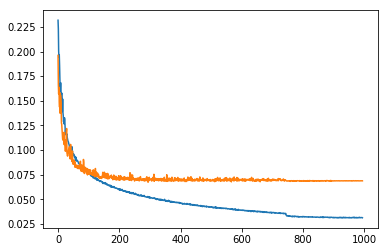

In [21]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [22]:
checkpoint = torch.load('../results/cnnnet/checkpoint-lr-scheduler.pth-best.tar')

## Loading the best model

In [23]:
from cpe775.utils.img_utils import show_landmarks_batch

In [24]:
best_model = Model(CNNNet((1, 224, 224), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

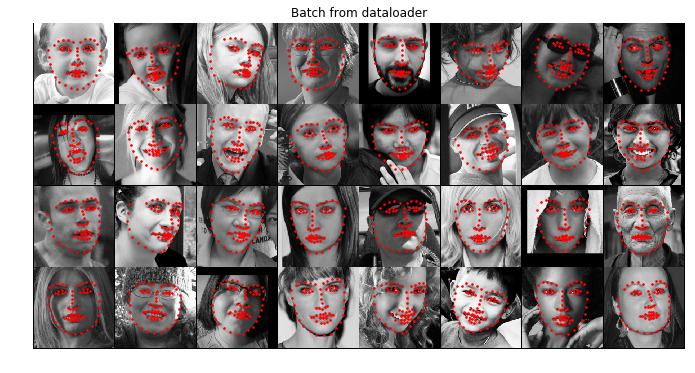

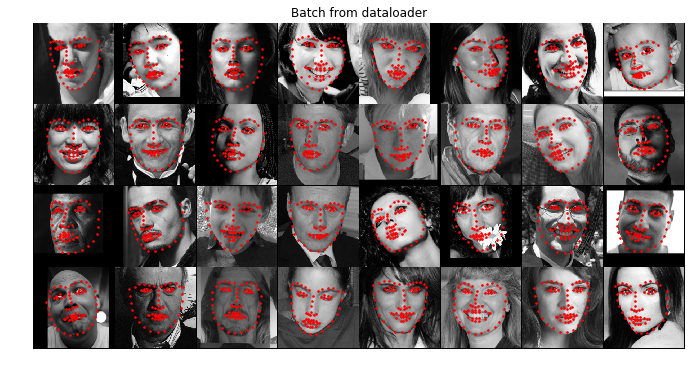

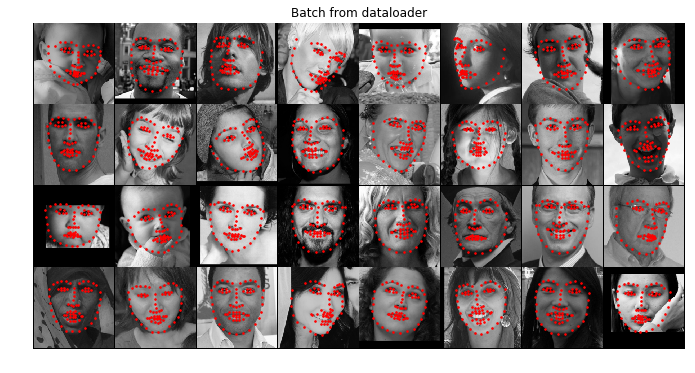

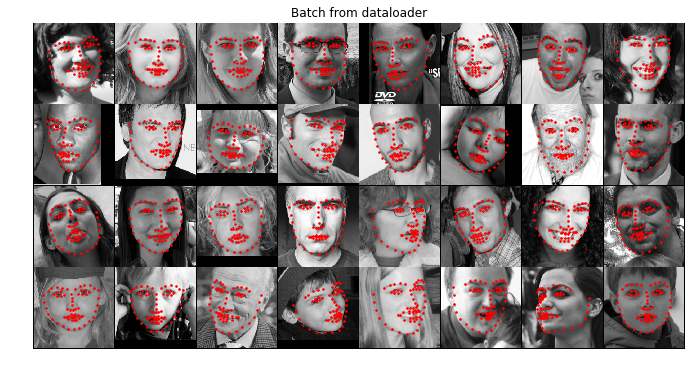

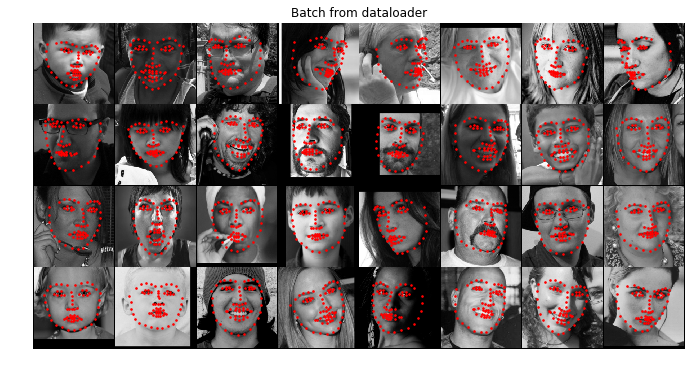

...

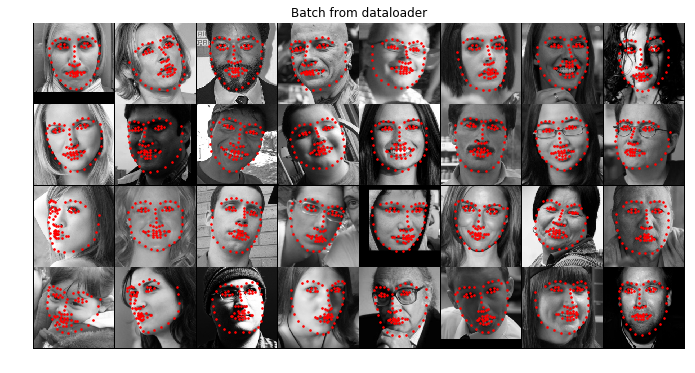

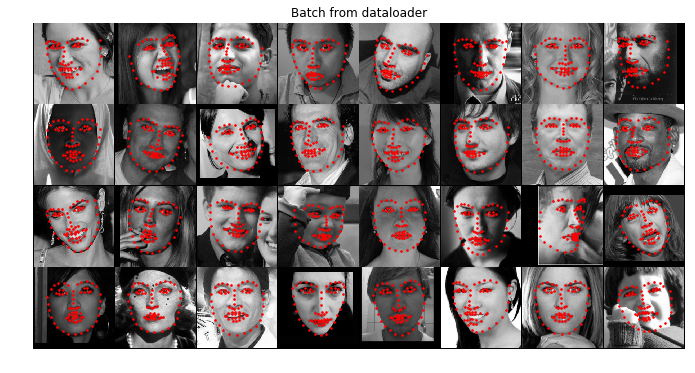

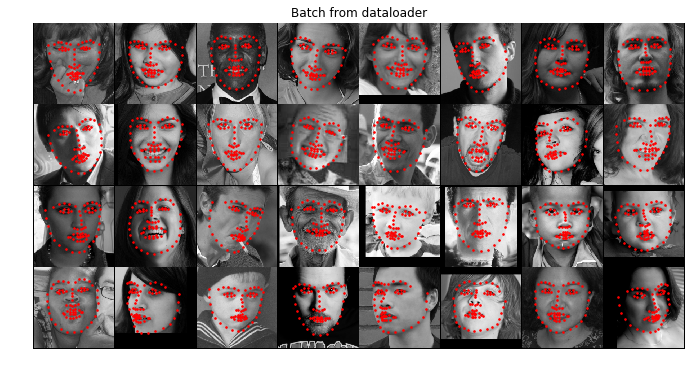

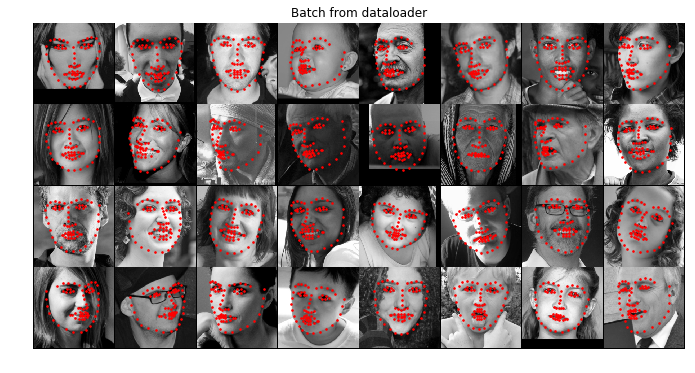

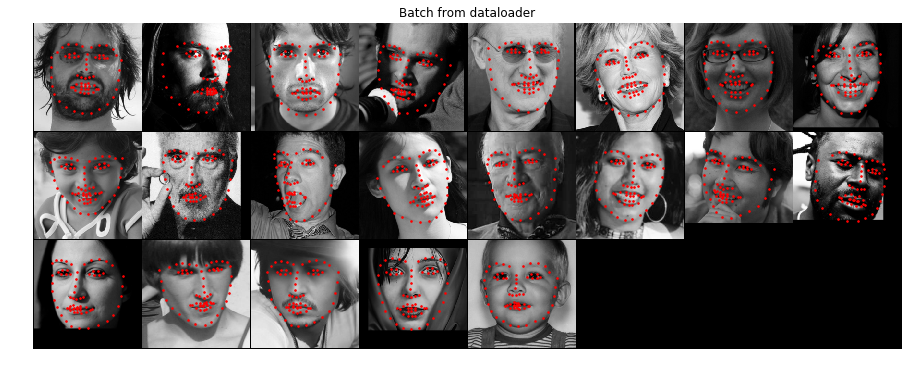

In [25]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [26]:
transforms = Compose([
                   CropFace(),                    
                   CenterCrop((224,224)),
                   ToGray(),
                   ToTensor()
                 ])

In [27]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

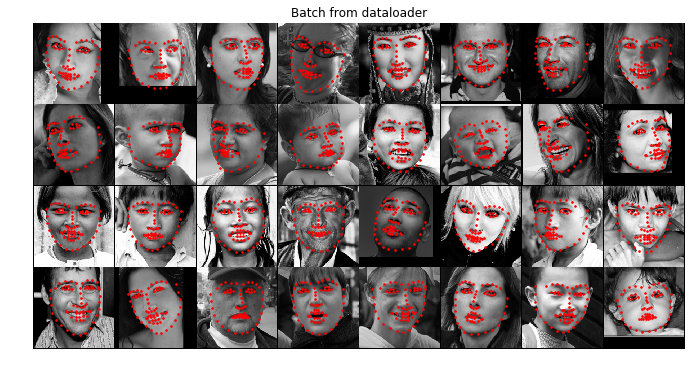

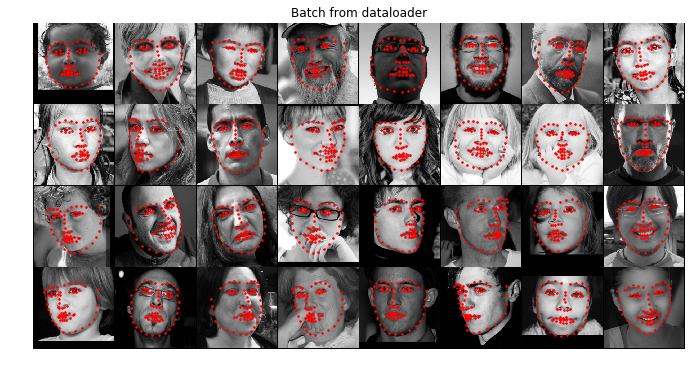

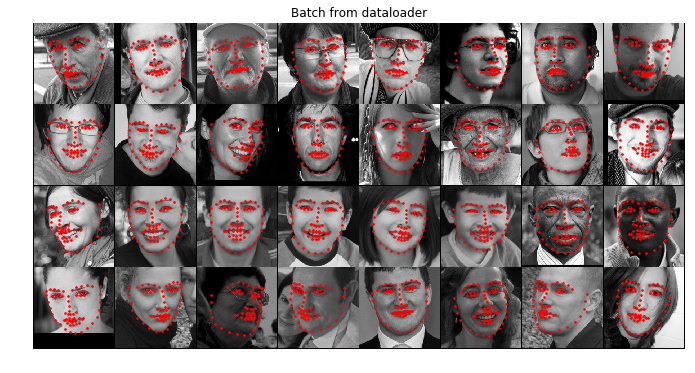

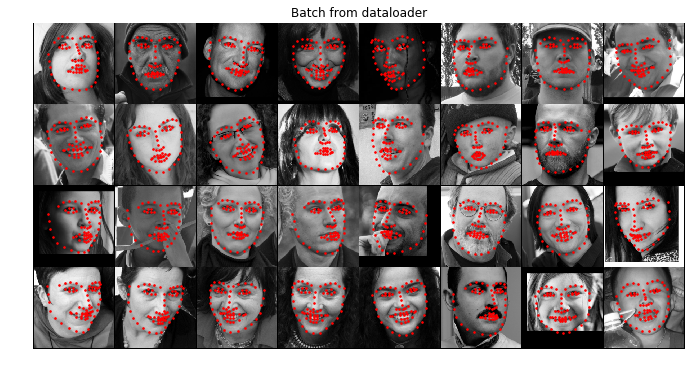

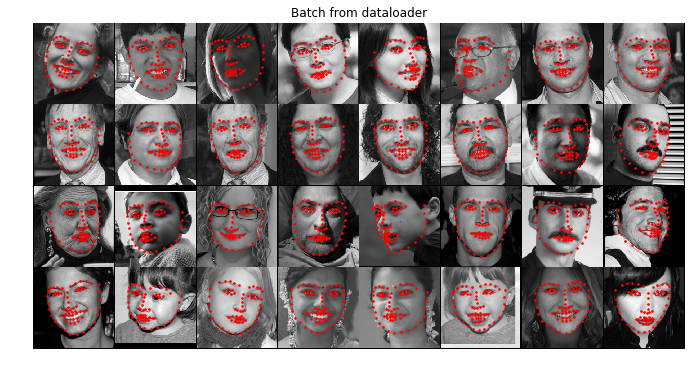

...

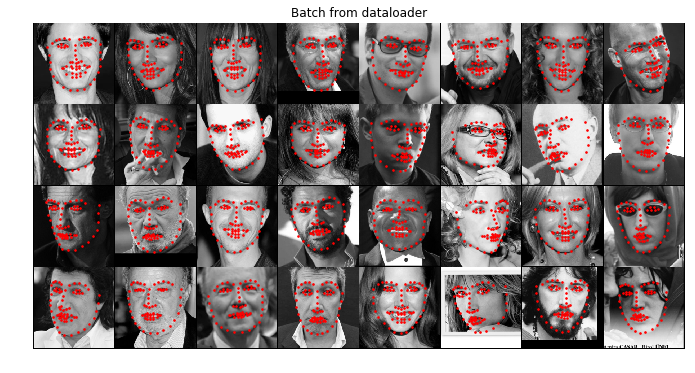

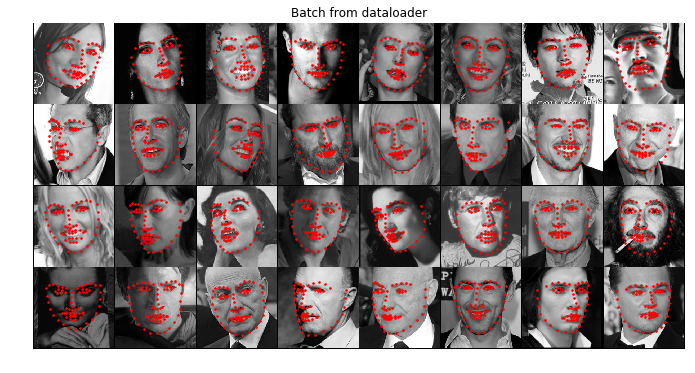

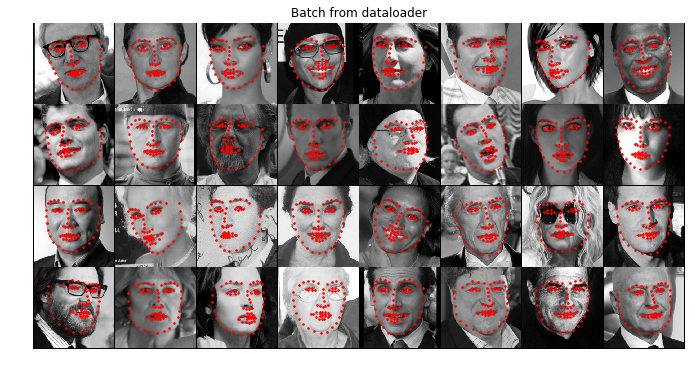

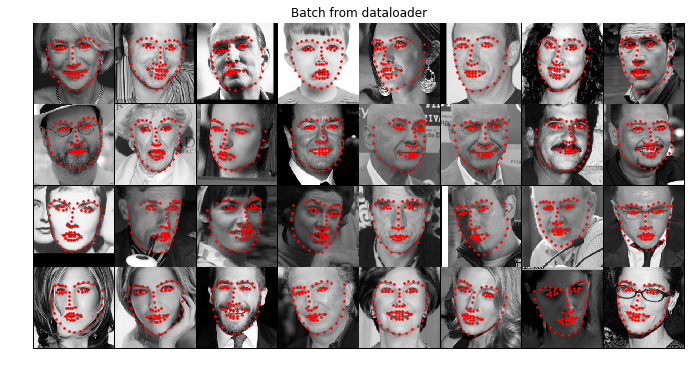

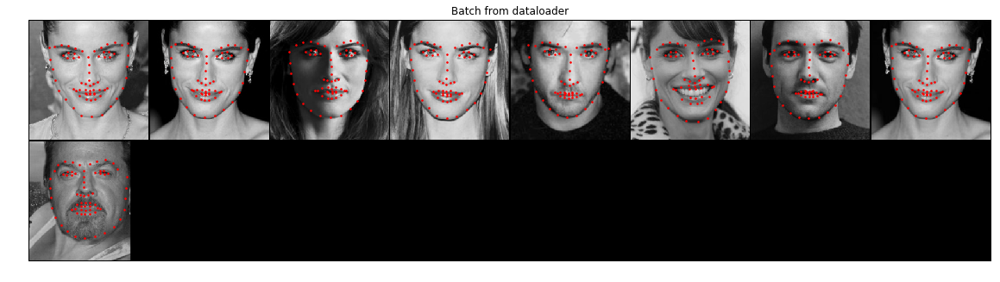

In [28]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [29]:
loss/len(dataset)

0.06484485002635401

### Challenging test

In [30]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

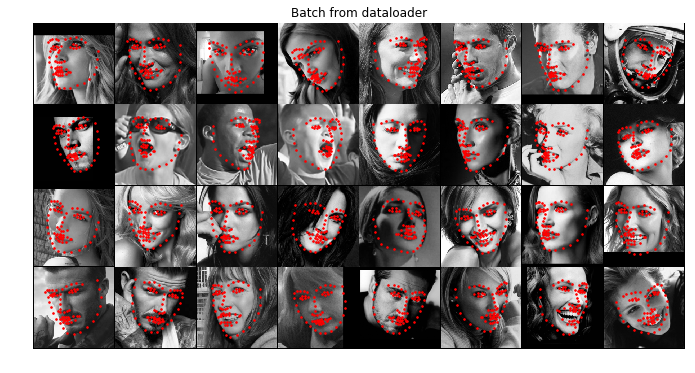

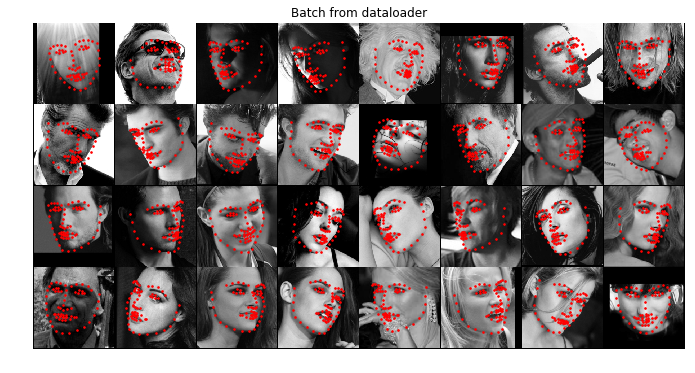

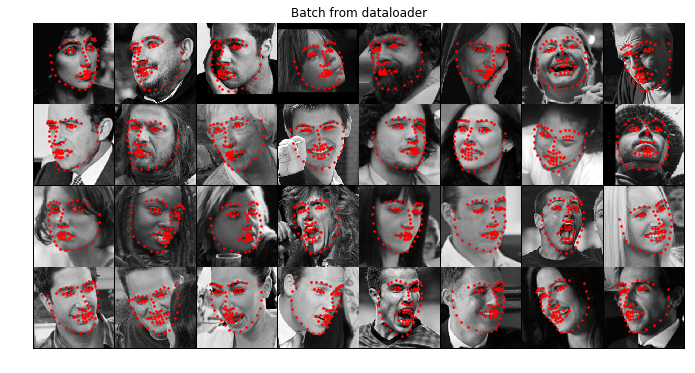

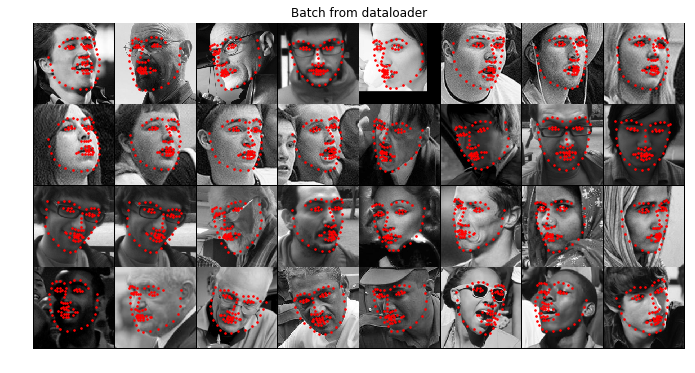

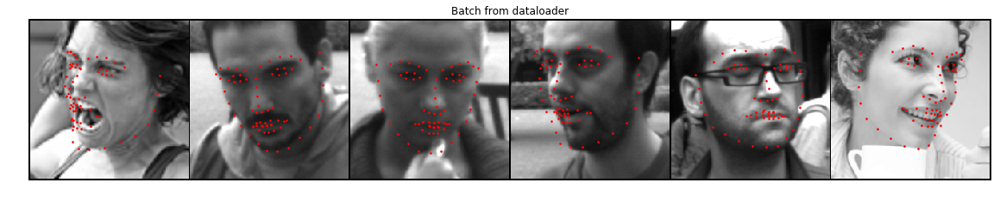

In [31]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [32]:
loss/len(challenging_set)

0.13867887265201825